<a href="https://colab.research.google.com/github/paulojrapuc/TCC/blob/main/Mapeamento_rosto_68pontos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reconhecimento de pontos do rosto


In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
import cv2
import numpy as np
import dlib
import matplotlib.pyplot as plt

In [3]:
%cd '/content/drive/MyDrive/tcc/'

/content/drive/MyDrive/tcc


In [4]:
imagem = cv2.imread("FotosPauloAlmeida/rostoAtual.jpg", cv2.IMREAD_GRAYSCALE)

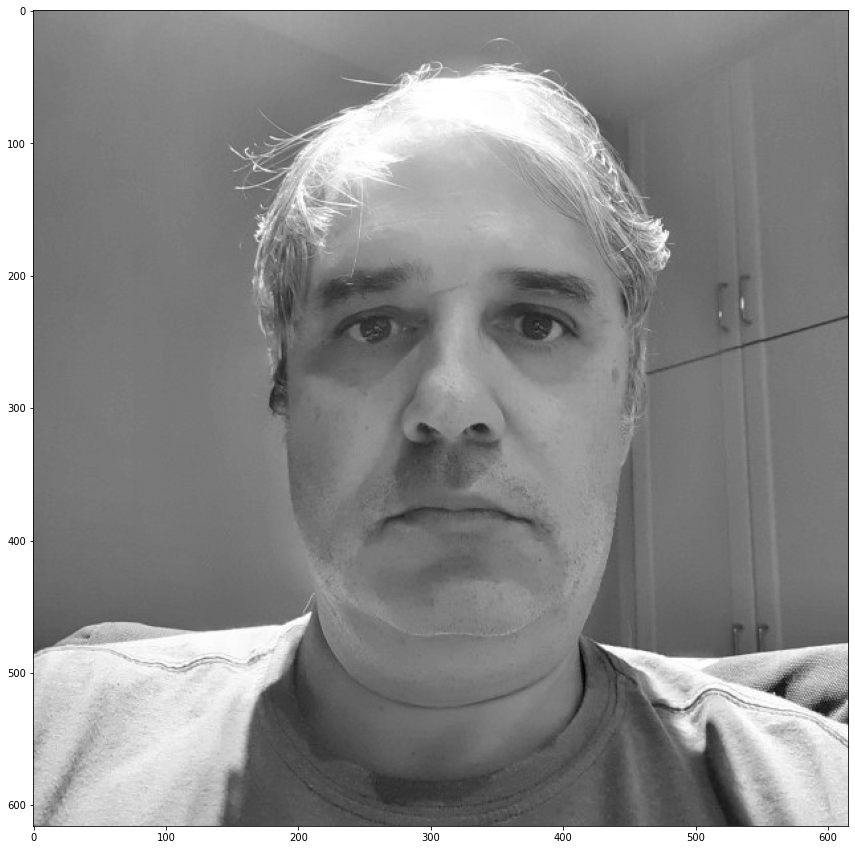

In [5]:
plt.figure(figsize=(15,15))
plt.imshow(imagem, cmap="gray")

In [6]:
!wget   http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bunzip2 /content/drive/MyDrive/tcc/shape_predictor_68_face_landmarks.dat.bz2

--2021-09-22 13:29:27--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2.7’

shape_predictor_68_ 100%[===================>]  61.07M  15.0MB/s    in 5.4s    

2021-09-22 13:29:34 (11.4 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2.7’ saved [64040097/64040097]

bunzip2: Output file /content/drive/MyDrive/tcc/shape_predictor_68_face_landmarks.dat already exists.


In [7]:
# Classificador 68 pontos

classificador_68_path = "shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_68_path)
detector_face = dlib.get_frontal_face_detector()

In [8]:
def anotar_rosto(imagem):
  retangulos = detector_face(imagem, 1)
  if len(retangulos) == 0:
    return None
  for k, d in enumerate(retangulos):
    # k - numero rostos encontrados  /  d - dimensões
    print(f"Rostos identificados: {str(k)}")
    cv2.rectangle(imagem, (d.left(), d.top()),(d.right(), d.bottom()), (255,255,0), 2)
  return imagem

In [9]:
def plota_imagem(imagem):
  plt.figure(figsize=(15,15))
  plt.imshow(imagem, cmap="gray")

Rostos identificados: 0


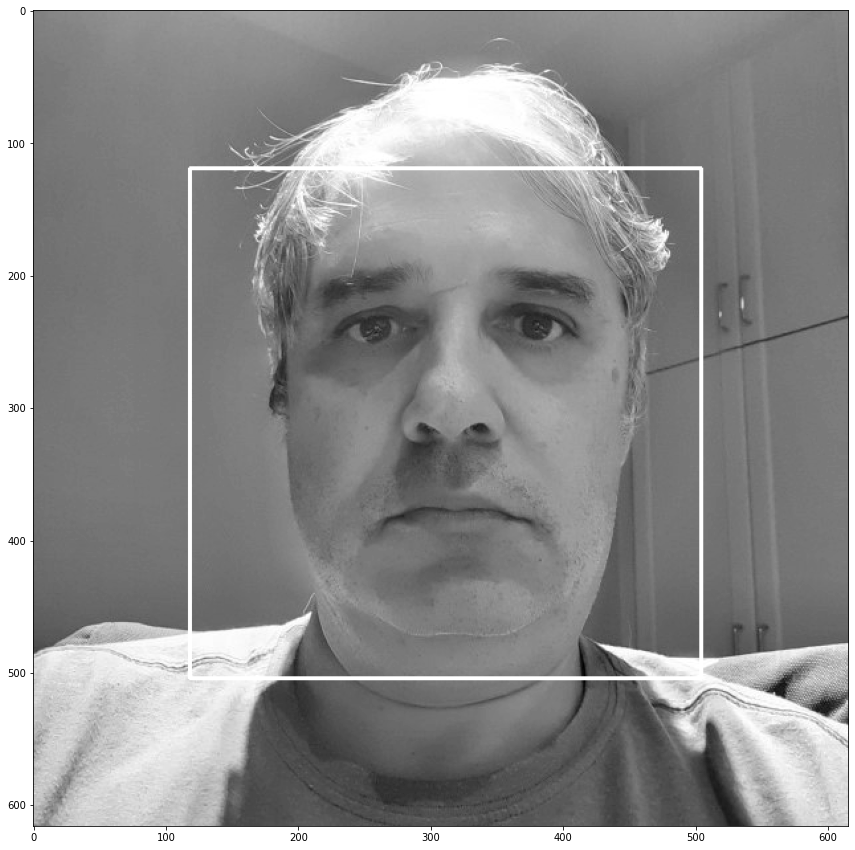

In [10]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)
plota_imagem(imagem_anotada)

In [11]:
def pontos_marcos_faciais(imagem):
  retangulos = detector_face(imagem, 1)
  if len(retangulos) == 0:
    return None
  marcos = []
  for ret in retangulos:
    marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem,ret).parts()]))
  return marcos

In [12]:
marcos_faciais = pontos_marcos_faciais(imagem_anotada)
len(marcos_faciais[0])

68

In [13]:
def anotar_marcos_faciais(imagem, marcos):
  for marco in marcos:
    for idx, ponto in enumerate(marco):
      centro = (ponto[0,0], ponto[0,1])
      cv2.circle(imagem, centro, 3, (0,0,0), -1)
      cv2.putText(imagem, str(idx),centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255),2)
  return imagem

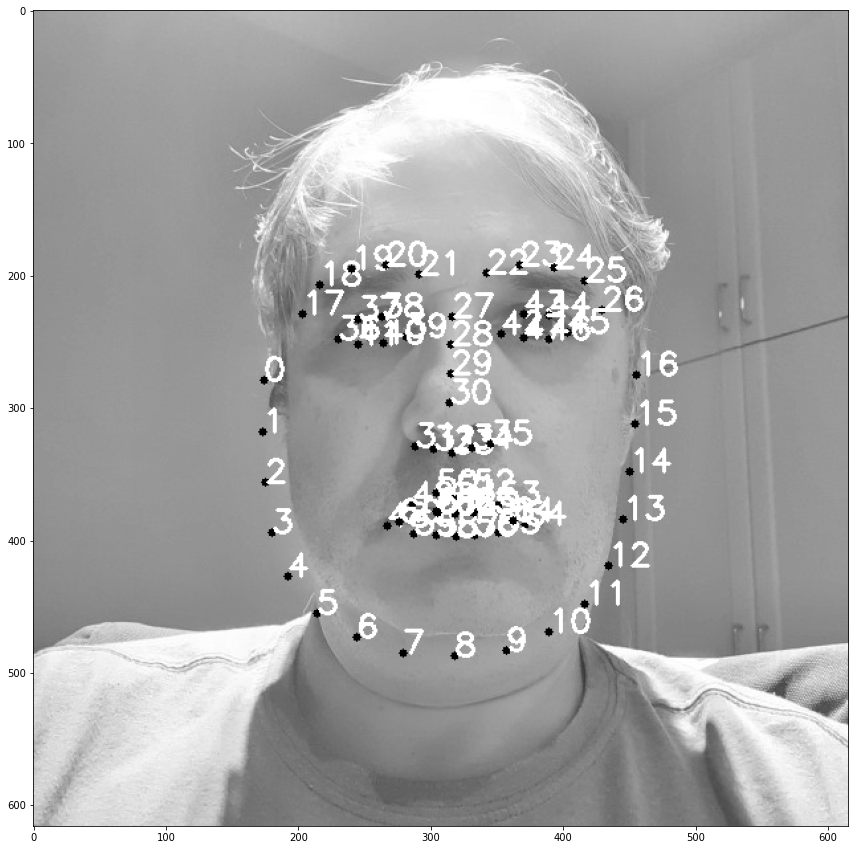

In [14]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)
plota_imagem(imagem_anotada)

In [15]:
# PONTOS DO ROSTO - ASPECTO RAZÃO 

ROSTO = list(range(17,68))
ROSTO_COMPLETO = list(range(0,68))
LABIOS = list(range(48,61))
SOBRANCELHA_DIREITA = list(range(17,22))
SOBRANCELHA_ESQUERDA = list(range(22,27))
OLHO_ESQUERDO = list(range(36,42))
OLHO_DIREITO = list(range(42,48))
NARIZ = list(range(27,35))
MANDIBULA = list(range(0,17))

In [16]:
from scipy.spatial import distance as dist

## Aspecto Razão

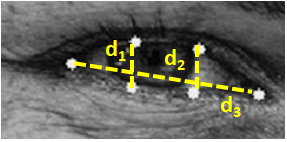

In [17]:
def aspecto_razao_olhos(pontos_olhos):
  a = dist.euclidean(pontos_olhos[1],pontos_olhos[5])
  b = dist.euclidean(pontos_olhos[2],pontos_olhos[4])
  c = dist.euclidean(pontos_olhos[0],pontos_olhos[3])

  aspecto_razao = (a+b) / (c * 2.0)

  return aspecto_razao

In [18]:
def anota_marcos_casca_convexa(imagem, marcos):
  retangulos = detector_face(imagem, 1)
  if len(retangulos) == 0:
    return None
  
  for idx, ret in enumerate(retangulos):
    marco = marcos[idx]

    pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
    cv2.drawContours(imagem, [pontos],0,(0,255,0),2)

    pontos = cv2.convexHull(marco[OLHO_DIREITO])
    cv2.drawContours(imagem, [pontos],0,(0,255,0),2)

  return imagem

Contorno dos olhos


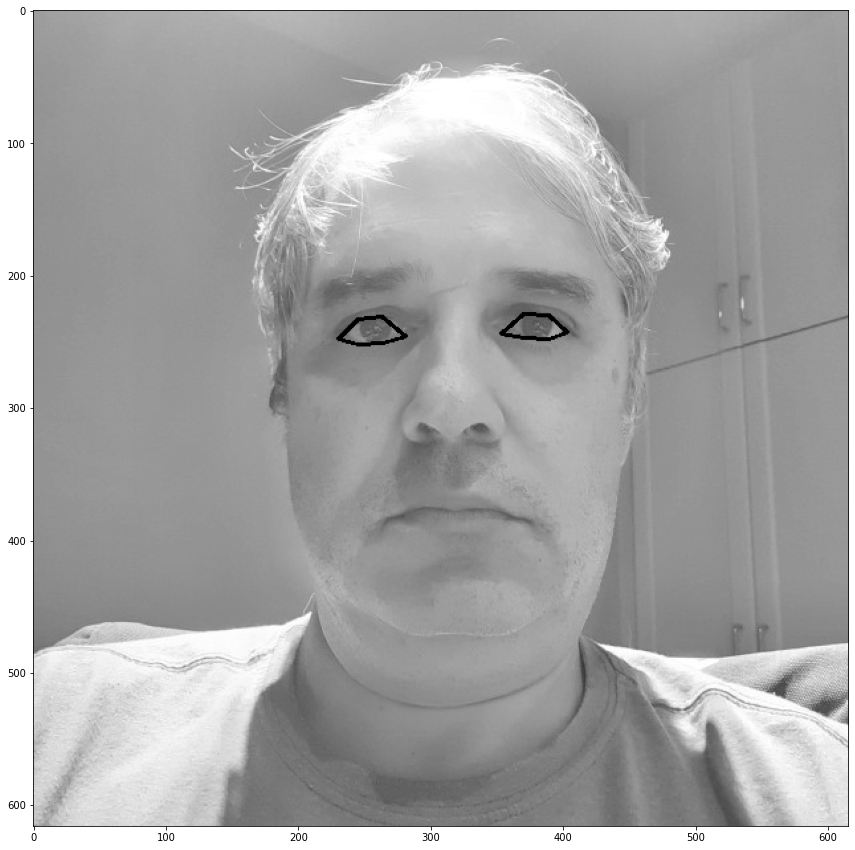

In [19]:
imagem_anotada = imagem.copy()
imagem_anotada = anota_marcos_casca_convexa(imagem, marcos_faciais)
print("Contorno dos olhos")
plota_imagem(imagem_anotada)

In [20]:
# distância entre olhos
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
print("Aspecto razão dos olhos: \n" \
      f"Olho esquerdo {valor_olho_esquerdo} \n" \
      f"Olho direito {valor_olho_direito}")

Aspecto razão dos olhos: 
Olho esquerdo 0.3823040321939709 
Olho direito 0.3599280215928025


In [21]:
def analisa_olhos(imagem):
  # plota imagem natural
  print("Imagem")
  plota_imagem(imagem)

  # anota rosto
  imagem_anotada = imagem.copy()
  imagem_anotada = anotar_rosto(imagem_anotada)
  plota_imagem(imagem_anotada)

  # anota marcos faciais
  marcos_faciais = pontos_marcos_faciais(imagem_anotada)
  imagem_anotada = imagem.copy()
  imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)
  plota_imagem(imagem_anotada)

  # plota imagem contorno
  imagem_anotada = imagem.copy()
  imagem_anotada = anota_marcos_casca_convexa(imagem, marcos_faciais)
  print("Contorno dos olhos")
  plota_imagem(imagem_anotada)

  # informa aspecto razão dos olhos
  valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
  valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
  print("Aspecto razão dos olhos: \n" \
        f"Olho esquerdo {valor_olho_esquerdo} \n" \
        f"Olho direito {valor_olho_direito}")

## Olhos fechados

Imagem
Rostos identificados: 0
Contorno dos olhos
Aspecto razão dos olhos: 
Olho esquerdo 0.21603322380952905 
Olho direito 0.21789787555987158


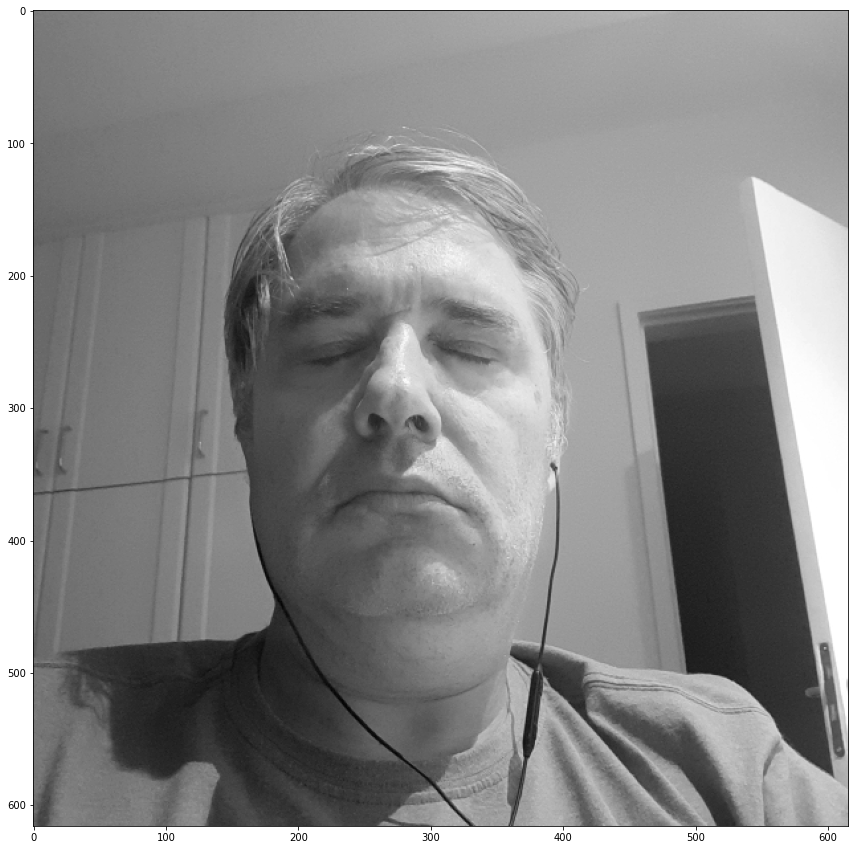

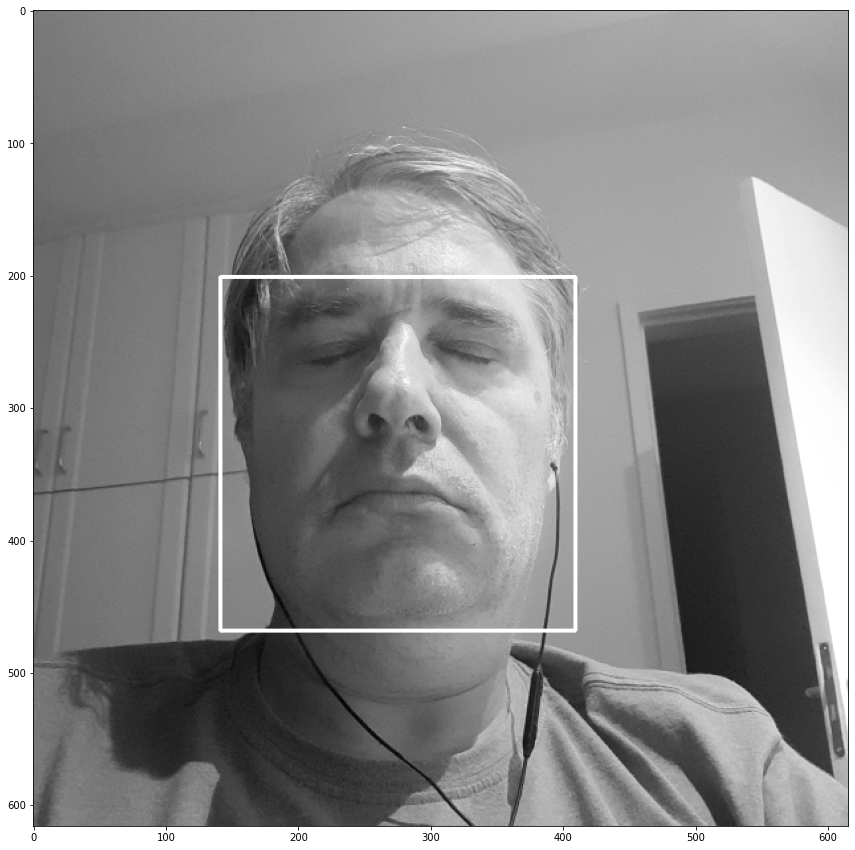

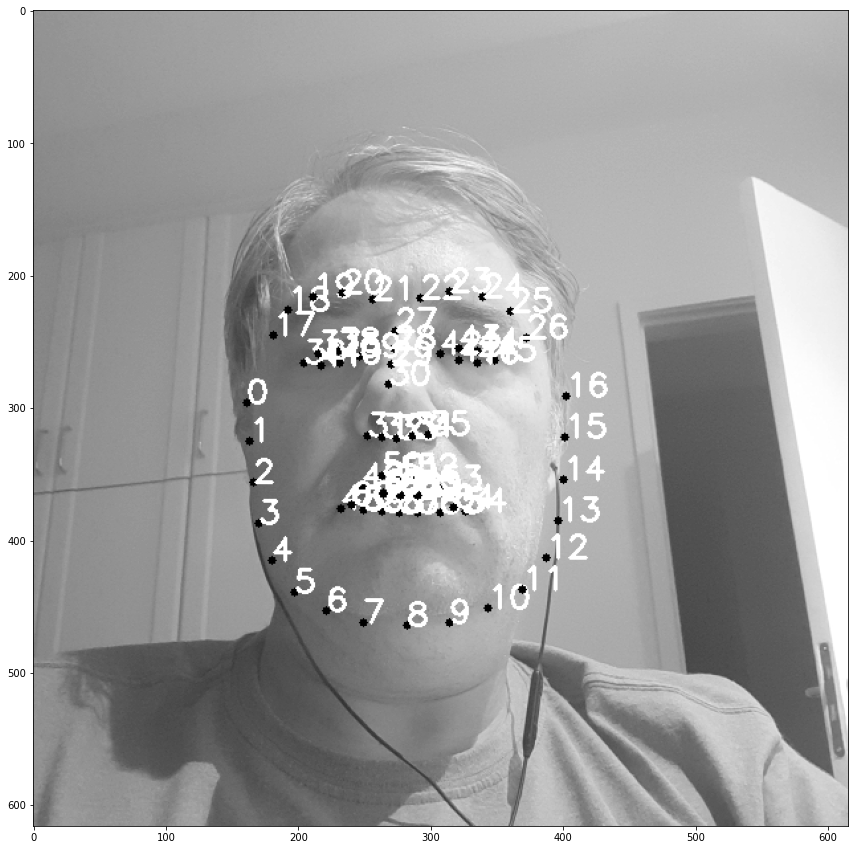

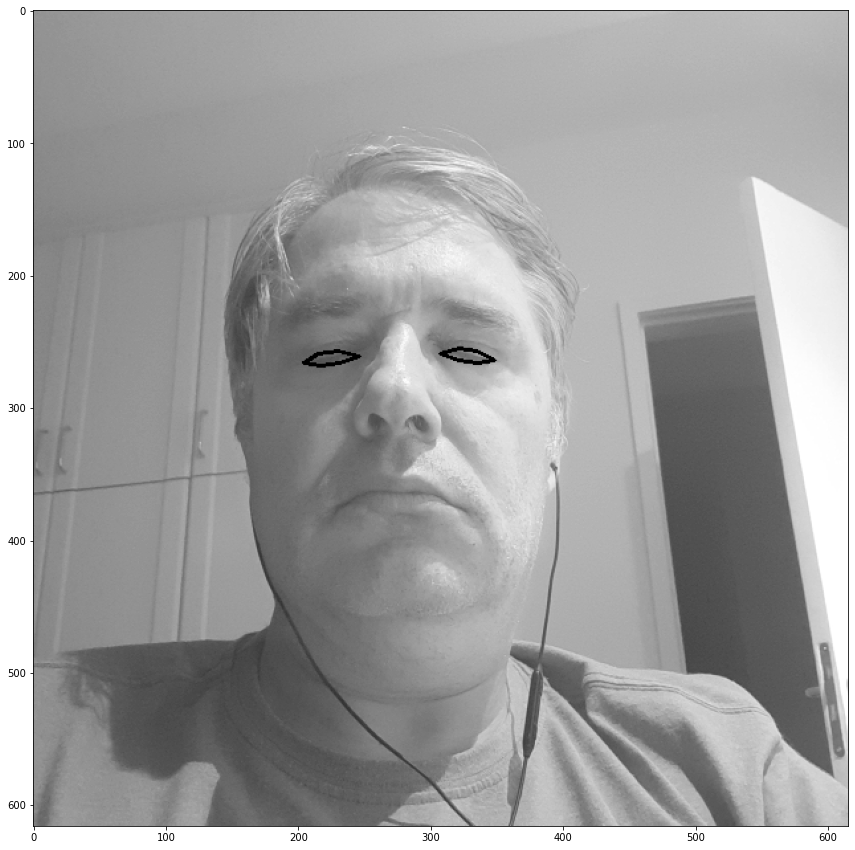

In [22]:
olhos_fechados = cv2.imread("FotosPauloAlmeida/olhosFechados.jpg", cv2.IMREAD_GRAYSCALE)
analisa_olhos(olhos_fechados)

## Olhos Semicerrados

Imagem
Rostos identificados: 0
Contorno dos olhos
Aspecto razão dos olhos: 
Olho esquerdo 0.29160339154569936 
Olho direito 0.2910986687241758


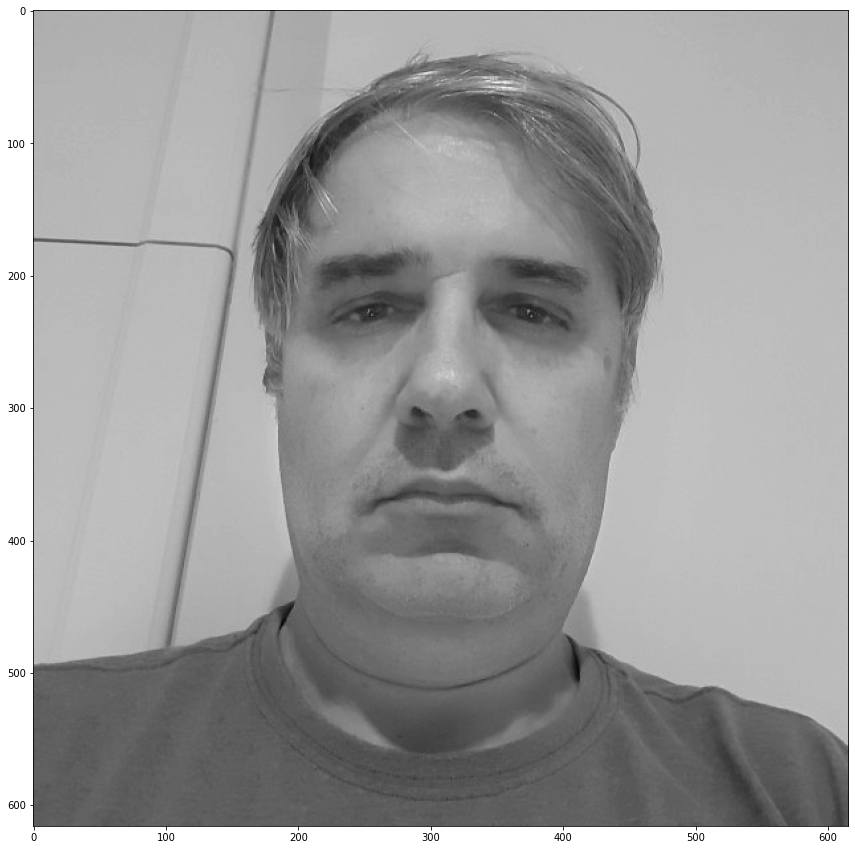

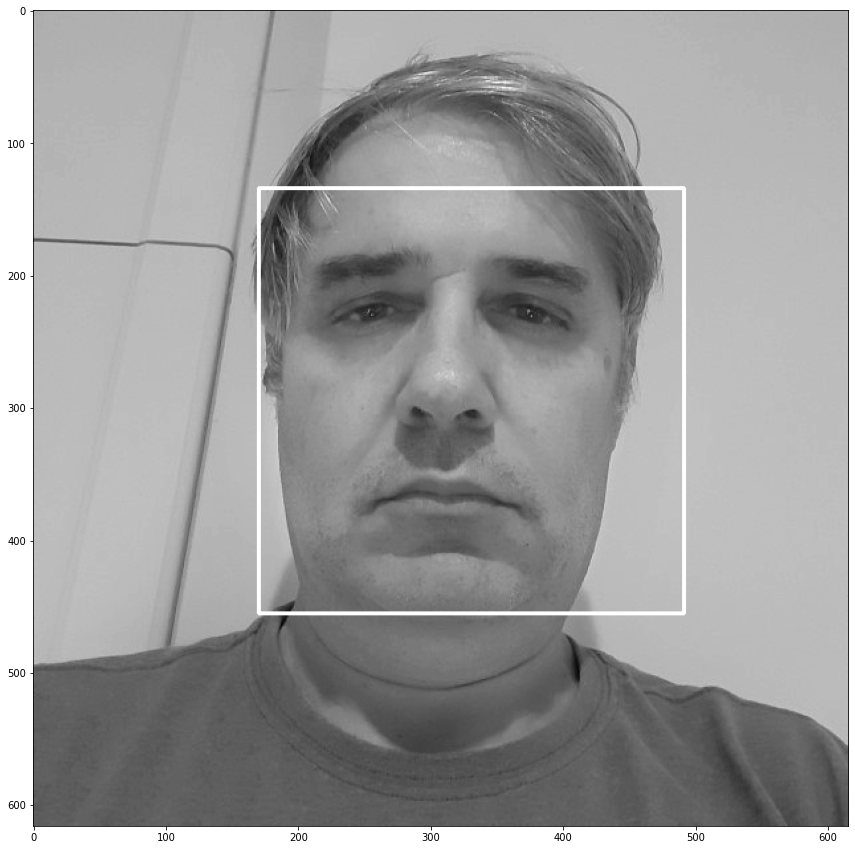

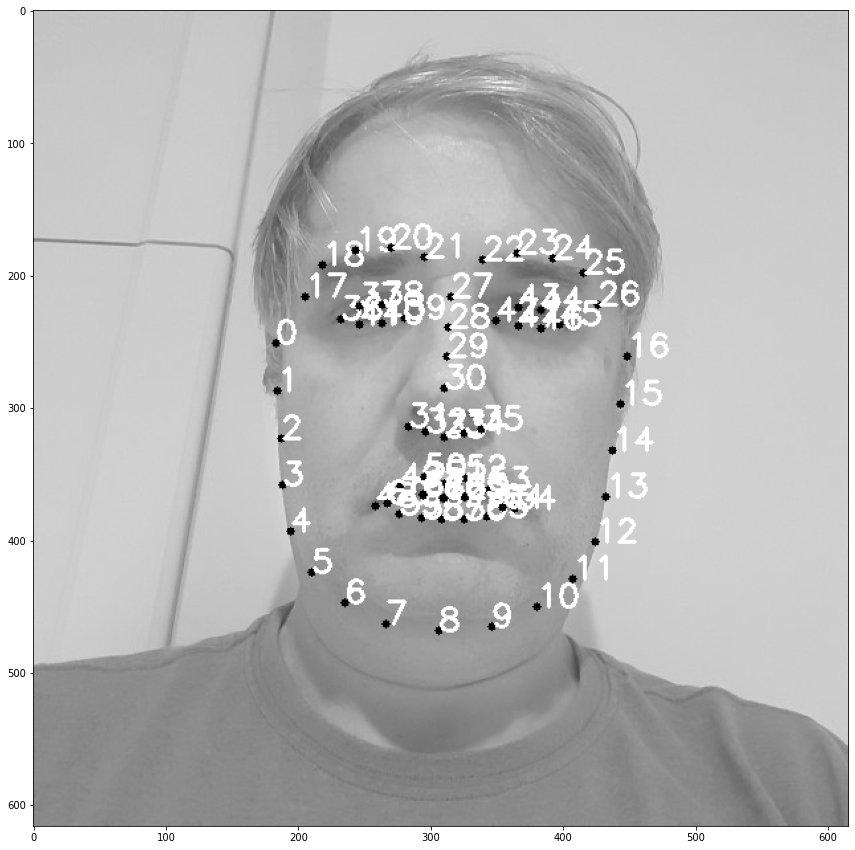

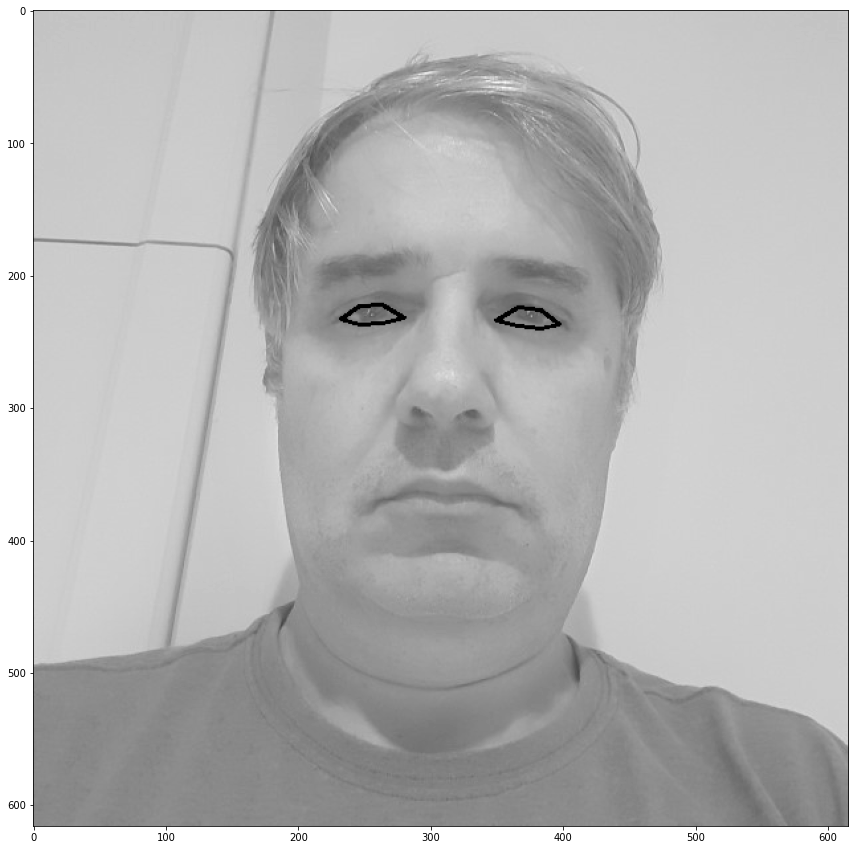

In [23]:
olhos_semicerrados = cv2.imread("FotosPauloAlmeida/semicerrados.jpg", cv2.IMREAD_GRAYSCALE)
analisa_olhos(olhos_semicerrados)

## Olhos Arregalados

Imagem
Rostos identificados: 0
Contorno dos olhos
Aspecto razão dos olhos: 
Olho esquerdo 0.46089988151779815 
Olho direito 0.4589682214477241


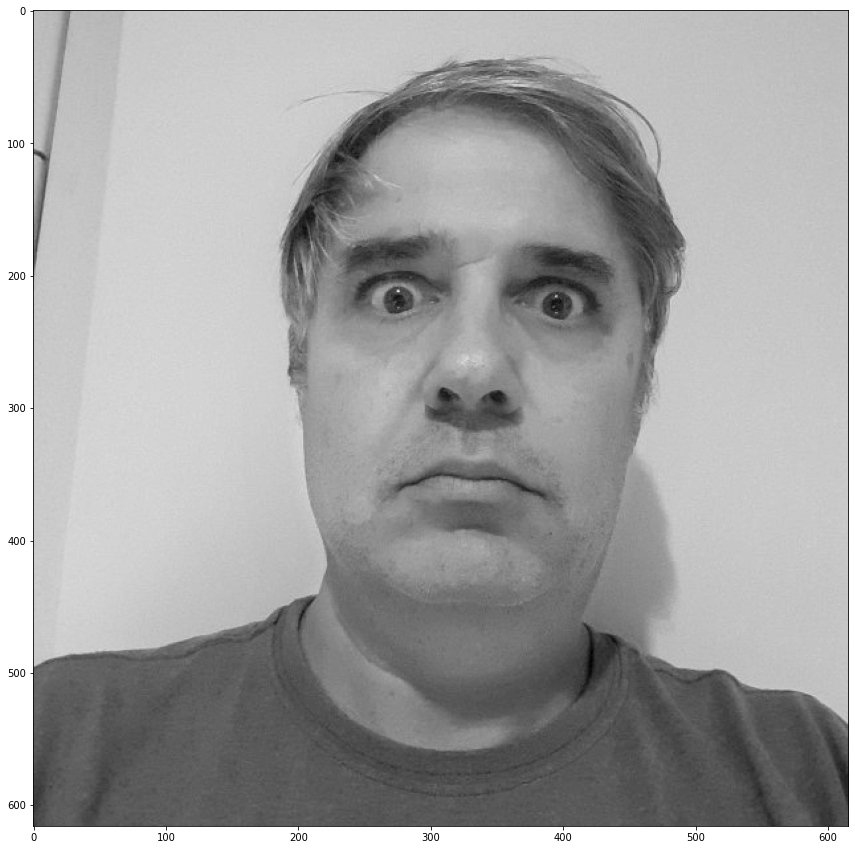

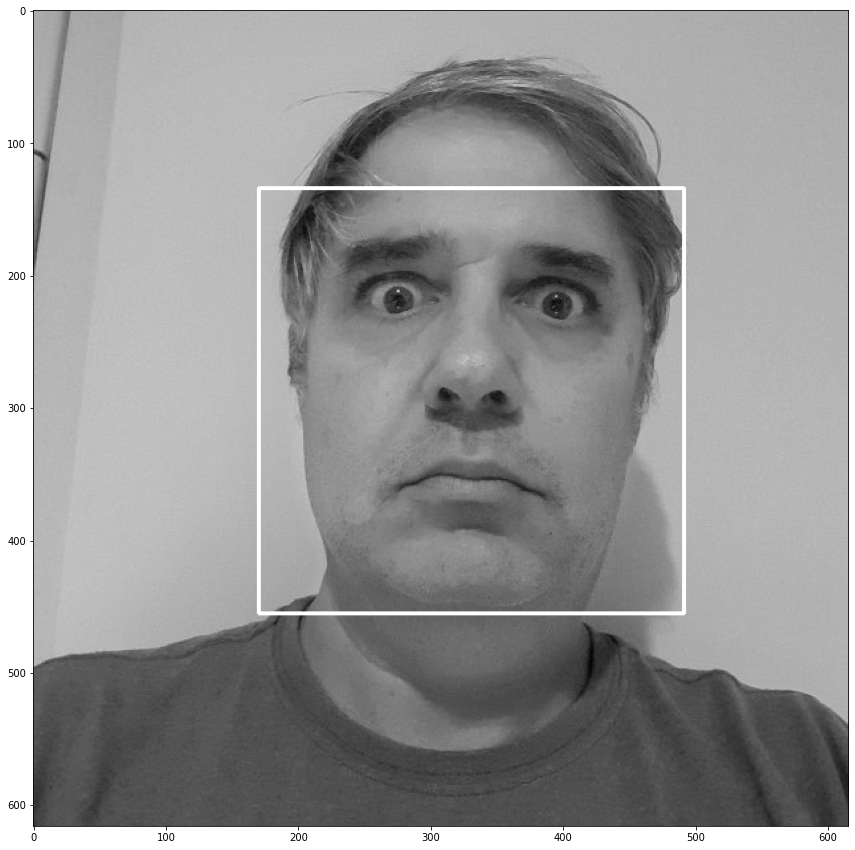

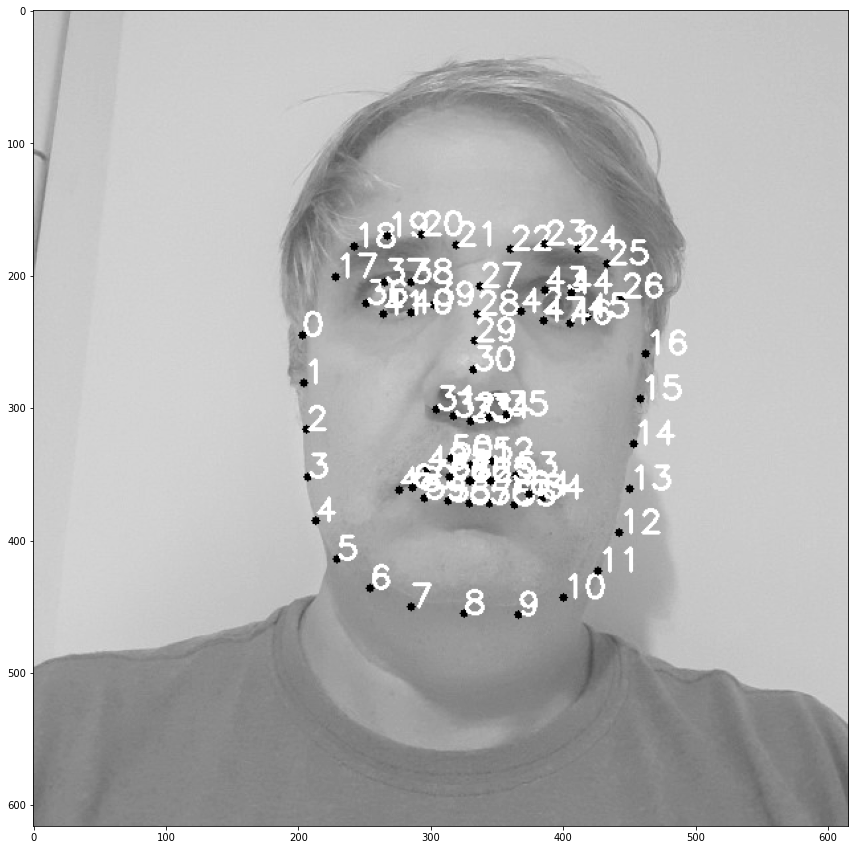

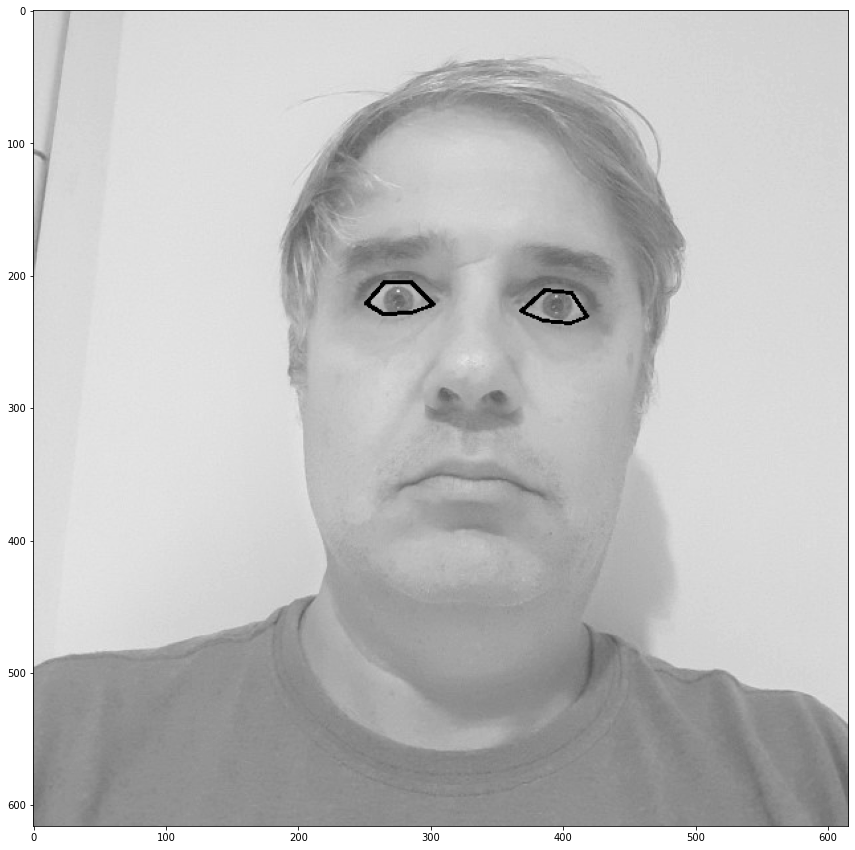

In [24]:
olhos_arregalados = cv2.imread("FotosPauloAlmeida/arregalados.jpg", cv2.IMREAD_GRAYSCALE)
analisa_olhos(olhos_arregalados)

Imagem
Rostos identificados: 0
Contorno dos olhos
Aspecto razão dos olhos: 
Olho esquerdo 0.3823040321939709 
Olho direito 0.3599280215928025


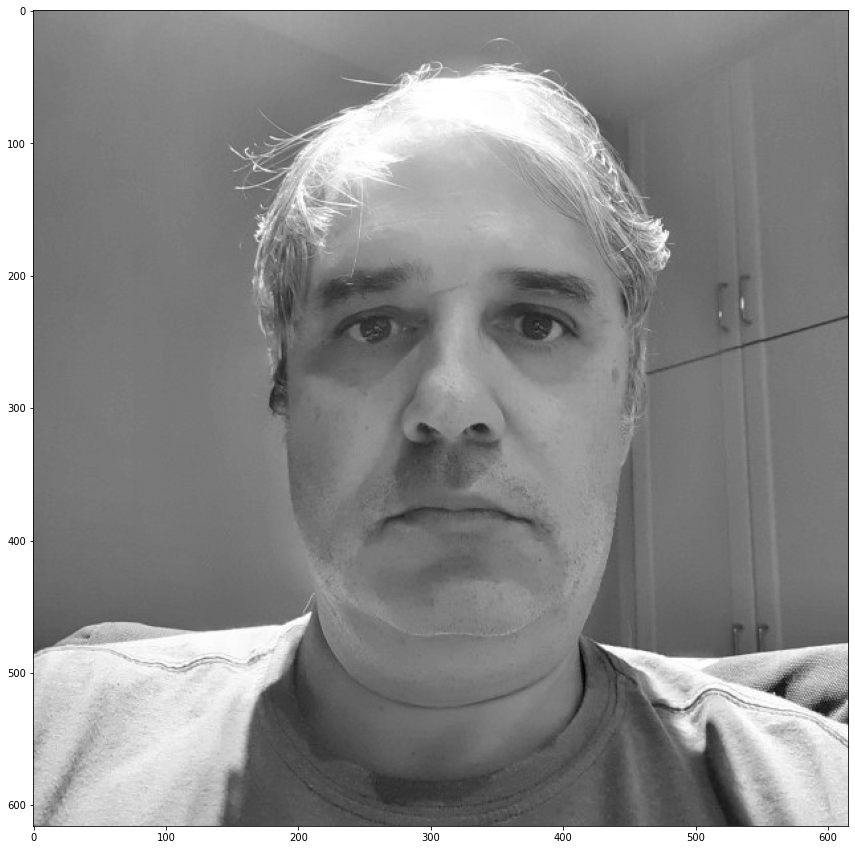

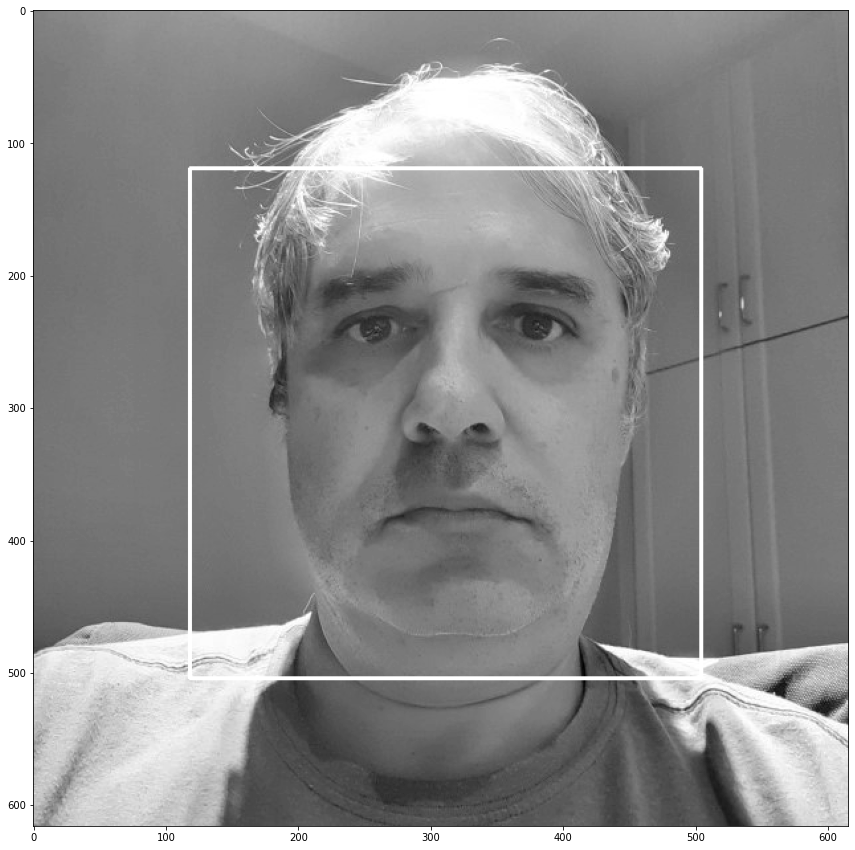

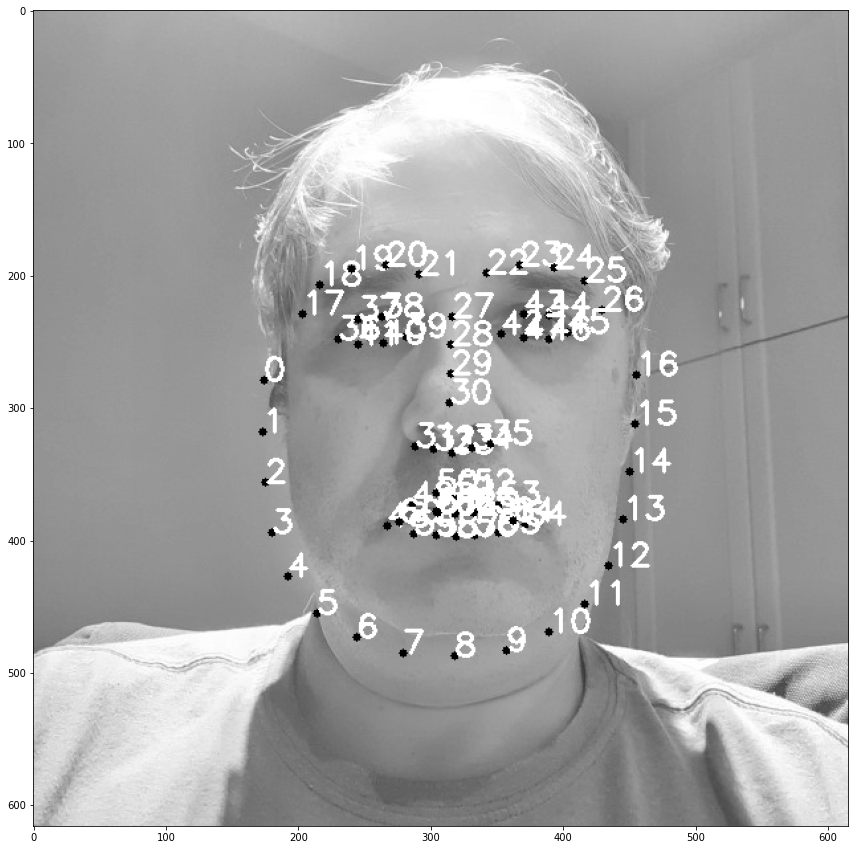

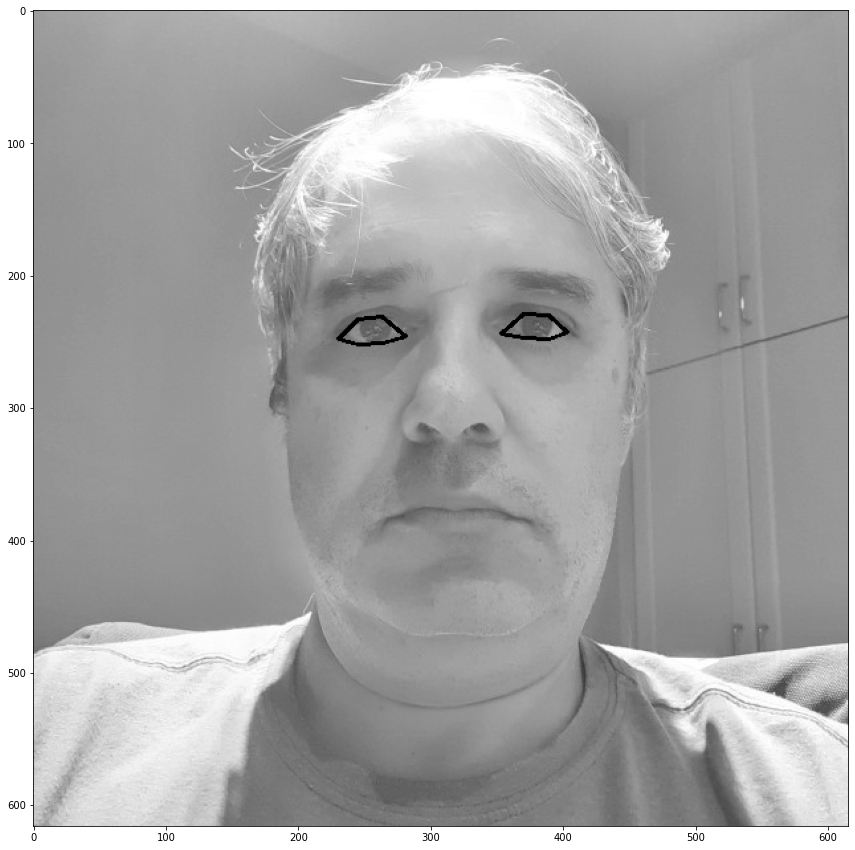

In [25]:
olhos_atual = cv2.imread("FotosPauloAlmeida/rostoAtual.jpg", cv2.IMREAD_GRAYSCALE)
analisa_olhos(olhos_atual)